In [26]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import math
from sklearn import svm
from sklearn import mixture
from sklearn.metrics import confusion_matrix
import glob

In [27]:
abdullah_training_directory = './images/Abdullah/training/'
mustafa_training_directory = './images/Mustafa/training/'
saleh_training_directory = './images/Saleh/training/'
adham_training_directory = './images/Adham/training/'

abdullah_testing_directory = './images/Abdullah/testing/'
mustafa_testing_directory = './images/Mustafa/testing/'
saleh_testing_directory = './images/Saleh/testing/'
adham_testing_directory = './images/Adham/testing/'


training_images_directories = [abdullah_training_directory, mustafa_training_directory, saleh_training_directory, adham_training_directory]
testing_images_directories = [abdullah_testing_directory, mustafa_testing_directory, saleh_testing_directory, adham_testing_directory]

training_images = []
testing_images = []

# Load the cascade for facial detection
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
# Populate Training Image list
for directory in training_images_directories:
    images = [cv2.imread(file) for file in glob.glob("{directory}*.jpg".format(directory=directory))]
    for img in images:
        training_images.append(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        
# Populate Testing Image list
for directory in testing_images_directories:
    images = [cv2.imread(file) for file in glob.glob("{directory}*.jpg".format(directory=directory))]
    for img in images:
        testing_images.append(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

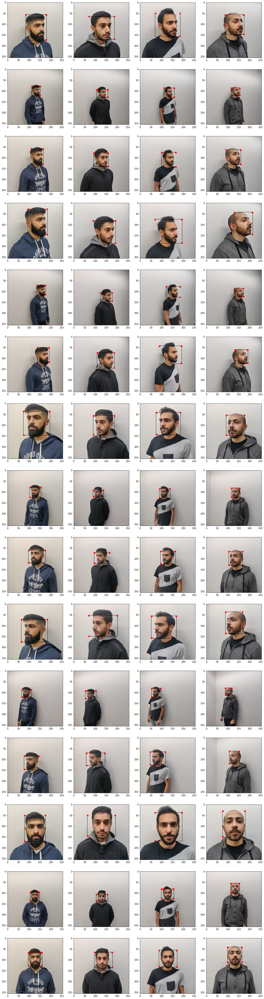

In [5]:
"""
4.1 + 4.3 --- Training Images Feature Extraction using SIFT
"""
training_bounds = []

plt.figure(figsize=(20, 80))
for i in range(60):
    img = training_images[i]
    # copy image
    img_disp = img.copy()
    # convert to grayscale
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # detect harris corners
    # cv2.cornerHarris(src, neighborhoodsize, sobelKernelSize, Harris_k)
    corners = cv2.cornerHarris(img_gray, 2, 3, 0.04)

    # normalize corner map [0,1]
    # cv2.normalize(src, dst, alpha, beta, norm_type)
    # min_I(dst(I)) = alpha, max_I(dst(I)) = beta
    cv2.normalize(corners, corners, 0, 1, cv2.NORM_MINMAX)

    # threshold for an optimal value
    thres = 0.5

    # list all points higher than threshold
    loc = np.where(corners >= thres)
    # loop though points
    
    pts = []
    
    for pt in zip(*loc[::-1]):
        pts.append(pt)
        
        # draw filled circle on each point
        cv2.circle(img_disp, pt, 4, (255,0,0), -1)

    xs, ys = np.array(list(zip(*pts)))
    bounds_dict = {"min_x" : np.amin(xs), "min_y" : np.amin(ys), "max_x" : np.amax(xs), "max_y" : np.amax(ys)}
    training_bounds.append(bounds_dict)
    
    # display images
    plt.subplot(15, 4, (math.floor(i/15) + 1 + 4*(i%15))), plt.imshow(img_disp)
    
plt.show()

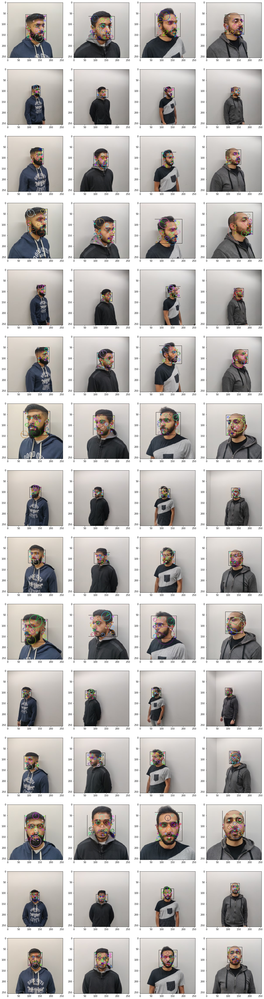

In [6]:
training_descriptors = []

K = 5

plt.figure(figsize=(20, 80))
for i in range(60):
    img = training_images[i]
    
    img_disp = img.copy()

    # create a SIFT object
    sift = cv2.xfeatures2d.SIFT_create()

    # detect SIFT features, with no masks
    keypoints = sift.detect(img, None)

    keypoints_filtered = []
    for kp in keypoints:
        point = kp.pt;
        if(point[0] > training_bounds[i]["min_x"] and point[0] < training_bounds[i]["max_x"] 
           and point[1] > training_bounds[i]["min_y"] and point[1] < training_bounds[i]["max_y"]):
            keypoints_filtered.append(kp)
    
    keypoints = keypoints_filtered

    # compute SIFT descriptors
    keypoints, descriptors = sift.compute(img, keypoints)
    
    clf = mixture.GaussianMixture(n_components = K, covariance_type='full')

    # fit GMM on train data
    clf.fit(descriptors)

    # predict cluster membership from the fitted GMM 
    labels = clf.predict(descriptors)
    
    descriptors_labels = {"keypoints" : keypoints, "descriptors" : descriptors, "labels" : labels}
    
    training_descriptors.append(descriptors_labels)
    
    # draw the keypoints
    cv2.drawKeypoints(img, keypoints, img_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    # display images
    plt.subplot(15, 4, (math.floor(i/15) + 1 + 4*(i%15))), plt.imshow(img_disp)    
    
plt.show()

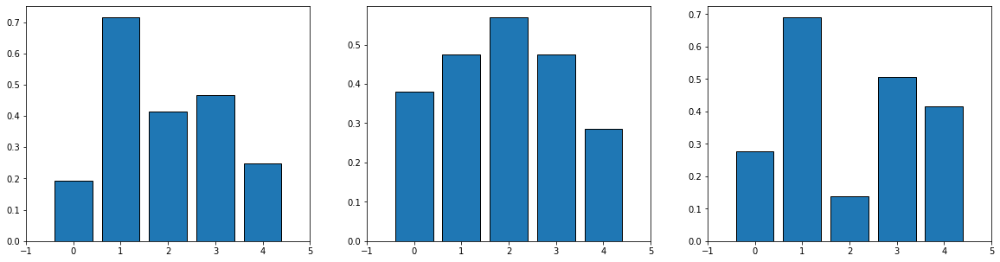

In [7]:
for i in range(60):
    freq = []
    for k in range(K):
        freq.append(np.count_nonzero(training_descriptors[i]["labels"] == k))
    
    training_descriptors[i]["histogram"] = freq/np.linalg.norm(freq)
    
plt.figure(figsize=(20, 5))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.bar(range(K), training_descriptors[i]["histogram"], edgecolor='k' )
    plt.xlim([-1, K]) # set x-axis limit
plt.show()

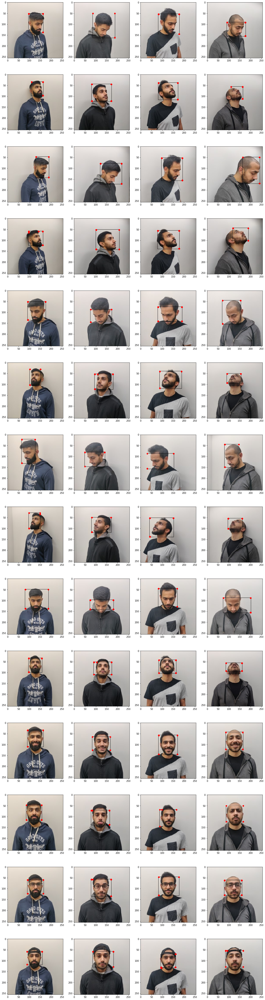

In [8]:
testing_bounds = []

plt.figure(figsize=(20, 80))
for i in range(56):
    img = testing_images[i]
    # copy image
    img_disp = img.copy()
    # convert to grayscale
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # detect harris corners
    # cv2.cornerHarris(src, neighborhoodsize, sobelKernelSize, Harris_k)
    corners = cv2.cornerHarris(img_gray, 2, 3, 0.04)

    # normalize corner map [0,1]
    # cv2.normalize(src, dst, alpha, beta, norm_type)
    # min_I(dst(I)) = alpha, max_I(dst(I)) = beta
    cv2.normalize(corners, corners, 0, 1, cv2.NORM_MINMAX)

    # threshold for an optimal value
    thres = 0.5

    # list all points higher than threshold
    loc = np.where(corners >= thres)
    # loop though points
    
    pts = []
    
    for pt in zip(*loc[::-1]):
        pts.append(pt)
        
        # draw filled circle on each point
        cv2.circle(img_disp, pt, 4, (255,0,0), -1)

    xs, ys = np.array(list(zip(*pts)))
    bounds_dict = {"min_x" : np.amin(xs), "min_y" : np.amin(ys), "max_x" : np.amax(xs), "max_y" : np.amax(ys)}
    testing_bounds.append(bounds_dict)
    
    # display images
    plt.subplot(14, 4, (math.floor(i/14) + 1 + 4*(i%14))), plt.imshow(img_disp)
    
plt.show()

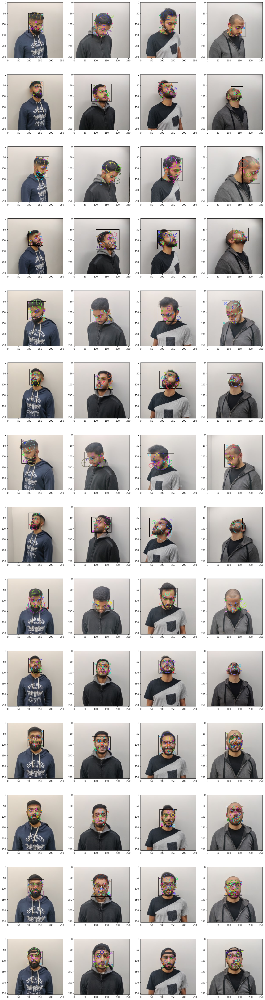

In [9]:
testing_descriptors = []

K = 5

plt.figure(figsize=(20, 80))
for i in range(56):
    img = testing_images[i]
    
    img_disp = img.copy()

    # create a SIFT object
    sift = cv2.xfeatures2d.SIFT_create()

    # detect SIFT features, with no masks
    keypoints = sift.detect(img, None)

    keypoints_filtered = []
    for kp in keypoints:
        point = kp.pt;
        if(point[0] > testing_bounds[i]["min_x"] and point[0] < testing_bounds[i]["max_x"] 
           and point[1] > testing_bounds[i]["min_y"] and point[1] < testing_bounds[i]["max_y"]):
            keypoints_filtered.append(kp)
    
    keypoints = keypoints_filtered

    # compute SIFT descriptors
    keypoints, descriptors = sift.compute(img, keypoints)
    
    clf = mixture.GaussianMixture(n_components = K, covariance_type='full')

    # fit GMM on train data
    clf.fit(descriptors)

    # predict cluster membership from the fitted GMM 
    labels = clf.predict(descriptors)
    
    descriptors_labels = {"keypoints" : keypoints, "descriptors" : descriptors, "labels" : labels}
    
    testing_descriptors.append(descriptors_labels)
    
    # draw the keypoints
    cv2.drawKeypoints(img, keypoints, img_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    # display images
    plt.subplot(14, 4, (math.floor(i/14) + 1 + 4*(i%14))), plt.imshow(img_disp)    
    
plt.show()

In [10]:
"""
HoG FEATURE EXTRACTION
"""

def hog_features(imgs, c_size=5, b_size=2, bins=9):
    returned_hog_feats = []
    cell_size = (c_size, c_size)  # h x w in pixels
    block_size = (b_size, b_size)  # h x w in cells
    nbins = bins  # number of orientation bins
    for img in imgs:
        # create HoG Object
        # winSize is the size of the image cropped to multiple of the cell size
        # all arguments should be given in terms of number of pixels
        hog = cv2.HOGDescriptor(_winSize=(img.shape[1] // cell_size[1] * cell_size[1],
                                        img.shape[0] // cell_size[0] * cell_size[0]),
                                _blockSize=(block_size[1] * cell_size[1],
                                            block_size[0] * cell_size[0]),
                                _blockStride=(cell_size[1], cell_size[0]),
                                _cellSize=(cell_size[1], cell_size[0]),
                                _nbins=nbins)

        n_cells = (img.shape[0] // cell_size[0], img.shape[1] // cell_size[1])

        # Compute HoG features
        hog_feats = hog.compute(img) \
                    .reshape(n_cells[1] - block_size[1] + 1,
                                n_cells[0] - block_size[0] + 1,
                                block_size[1], block_size[0], nbins) \
                    .transpose((1, 0, 3, 2, 4))  # index blocks by rows first
        returned_hog_feats.append(hog_feats)
    return np.array(returned_hog_feats) # To perform np functions

In [25]:
"""
4.3 Experiment 1

Crop images after extracting sift keypoints then HoG of new cropped img

"""

cell_sizes_train = {3: None, 4:None, 5:None}
cell_sizes_test = {3: None, 4: None, 5: None}

for size in cell_sizes_train.keys():
    hog_imgs_test = []
    hog_imgs_train = []
    img_crop_test = []
    img_crop_train = []
    
    for j in range(int(len(training_images)/15)):  # 4
        
        hog_feats_per_person = []
        
        for i in range(15 * j, (15 * j) + 15):
            img = training_images[i]

            # Draw 15x15 around each keypoint
            for kp in training_descriptors[i]["keypoints"]:
                min_y = int(kp.pt[1] - 7)
                max_y = int(kp.pt[1] + 7)
                min_x = int(kp.pt[0] - 7)
                max_x = int(kp.pt[0] + 7)

                img_crop_train.append(cv2.cvtColor(img[min_y:max_y, min_x:max_x], cv2.COLOR_RGB2GRAY))

            hog_feats_per_img = (hog_features(np.array(img_crop_train),c_size=size))
            hog_feats_per_img = hog_feats_train.reshape(len(hog_feats_train),-1)
            hog_feats_per_person.append(hog_feats_kp)
        
        hog_imgs_train.append(hog_feats_per_person)
       
    
    # Get Testing Images KP + HoG feats
    for j in range(int(len(training_images)/15)):  # 4
        
        hog_feats_per_person = []

        for i in range((14 * j), (14 * j) + 14):
            img = testing_images[i]

            # Draw 15x15 around each keypoint
            for kp in testing_descriptors[i]["keypoints"]:
                min_y = int(kp.pt[1] - 7)
                max_y = int(kp.pt[1] + 7)
                min_x = int(kp.pt[0] - 7)
                max_x = int(kp.pt[0] + 7)

                img_crop_test.append(cv2.cvtColor(img[min_y:max_y, min_x:max_x], cv2.COLOR_RGB2GRAY))

            hog_feats_per_img = (hog_features(np.array(img_crop_test),c_size=size))
            hog_feats_per_img = hog_feats_test.reshape(len(hog_feats_test),-1)
            hog_feats_per_person.append(hog_feats_kp)
        
        hog_imgs_test.append(hog_feats_per_person)
       
    cell_sizes_test[size] = hog_imgs_test
    cell_sizes_train[size] = hog_imgs_train

    
# img_crop
print(len(cell_sizes_test[3]))
print(len(cell_sizes_test[3][0]))
print(len(cell_sizes_test[3][0][0]))
print(len(cell_sizes_test[3][0][0][0]))

4
14
2735
36


TypeError: object of type 'numpy.float32' has no len()

In [74]:
"""
4 for loops : For each img in test_imgs
    for each kp1 in img
        for each img in train img:
            for each kp2 in img:
                find min (hog(kp1) - hog(kp2))
"""


for test_id, test_hogs in enumerate(cell_sizes_test[3]):
    for test_hog in test_hogs:
        for train_id, train_hogs in enumerate(cell_sizes_train[3]):
            for train_hog in train_hogs:
                

predictions = []
# for test_img in testing_images:
for test_index, hog_list_test in enumerate(cell_sizes_test[3]):
    index = 0
    min_dist = 999
    for kp_hog_test in hog_list_test:
        for train_index, hog_list_train in enumerate(cell_sizes_train[3]):
            for kp_hog_train in hog_list_train:
                if np.linalg.norm(kp_hog_test - kp_hog_train) < min_dist:
                    min_dist = np.linalg.norm(kp_hog_test - kp_hog_train)
                    index = train_index
    predictions.append(index)

        
print(predictions)

KeyboardInterrupt: 

In [ ]:
cell_sizes_test[3]